In [ ]:
# Import necessary libraries
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Activation, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
from tensorflow.keras.metrics import MeanIoU
from tqdm import tqdm
import cv2

# Define color mapping for masks
class_to_color = {
    10: (250, 149, 10),  # Orange - Hood
    20: (19, 98, 19),    # Dark Green - Front Door
    30: (249, 249, 10),  # Yellow - Rear Door
    40: (10, 248, 250),  # Cyan - Frame
    50: (149, 7, 149),   # Purple - Rear Quarter Panel
    60: (5, 249, 9),     # Light Green - Trunk Lid
    70: (20, 19, 249),   # Blue - Fender
    80: (249, 9, 250),   # Pink - Bumper
    90: (0, 0, 0)        # Black for "rest of car"
}

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [ ]:
# Function to preprocess masks
def preprocess_mask(mask, num_classes=9):
    mask = np.clip((mask - 10) / 10, 0, num_classes - 1)
    return to_categorical(mask, num_classes)

# Function to generate data in batches
def data_generator(file_names, data_directory, batch_size, num_classes=9, target_size=(224, 224)):
    while True:
        np.random.shuffle(file_names)
        for i in range(0, len(file_names), batch_size):
            batch_files = file_names[i:i + batch_size]
            images, masks = [], []

            for file in batch_files:
                data = np.load(os.path.join(data_directory, file))

                # Resize the image if it's not the target size
                if data.shape[:2] != target_size:
                    image = cv2.resize(data[:, :, :3], (224, 224))
                    images.append(image)
                    mask = preprocess_mask(data[:, :, 3], num_classes)
                    mask = cv2.resize(mask, (224, 224), interpolation=cv2.INTER_NEAREST)
                    masks.append(mask)
                else:
                    images.append(data[:, :, :3])
                    mask = preprocess_mask(data[:, :, 3], num_classes)
                    masks.append(mask)

            yield np.array(images), np.array(masks)

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
import tensorflow as tf

def pretrained_and_fine_tuned_model(input_size=(224, 224, 3), num_classes=9):
    # Load the DenseNet model
    densenet_model = tf.keras.applications.DenseNet121(weights='imagenet', include_top=False, input_shape=input_size)

    # Freeze the layers of the DenseNet model
    for layer in densenet_model.layers:
        layer.trainable = False

    # Decoder part
    x = densenet_model.output
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = concatenate([x, densenet_model.get_layer('conv4_block24_concat').output])
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = concatenate([x, densenet_model.get_layer('conv3_block12_concat').output])
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = concatenate([x, densenet_model.get_layer('conv2_block6_concat').output])
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    x = concatenate([x, densenet_model.get_layer('conv1/relu').output])
    x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)

    # Output layer
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(x)

    # Create the model
    model = Model(inputs=densenet_model.input, outputs=outputs)

    return model

In [ ]:
# Early stopping and model checkpoint callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('pretrained_best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)

In [ ]:
dataset_directory = '/kaggle/input/final-data/arrays_processed'
file_names = os.listdir(dataset_directory)
train_files, val_files = train_test_split(file_names, test_size=0.2, random_state=42)

In [ ]:
import tensorflow.keras.backend as K

def dice_coefficient(y_true, y_pred, smooth=1e-7):
    # Flatten the tensors
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    # Compute the intersection and sum of true and predicted values
    intersection = K.sum(y_true_f * y_pred_f)
    sum_true_pred = K.sum(y_true_f) + K.sum(y_pred_f)
    # Compute Dice coefficient
    return K.mean((2. * intersection + smooth) / (sum_true_pred + smooth))

'\ndef dice_loss(y_true, y_pred):\n    return 1 - dice_coefficient(y_true, y_pred)\n'

In [ ]:
import tensorflow as tf

# Check the available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)

# Using MirroredStrategy
strategy = tf.distribute.MirroredStrategy()

print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

# Initialize and compile the U-Net model
with strategy.scope():
    model = pretrained_and_fine_tuned_model()
    model.compile(optimizer=Adam(lr=1e-4), loss='categorical_crossentropy',
              metrics=['accuracy', MeanIoU(num_classes=9), dice_coefficient])

2 Physical GPUs, 2 Logical GPUs
Number of devices: 2


In [ ]:
# Training using data generator
train_gen = data_generator(train_files, dataset_directory, batch_size=16, num_classes=9)
val_gen = data_generator(val_files, dataset_directory, batch_size=16, num_classes=9)

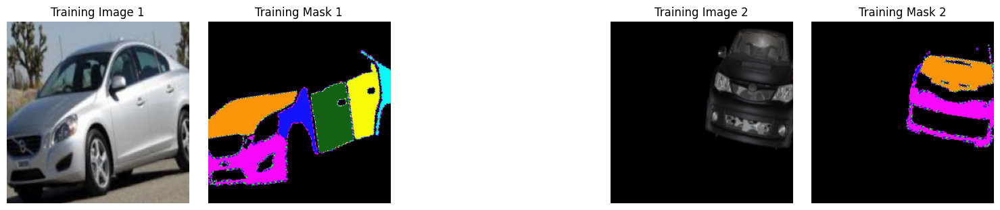

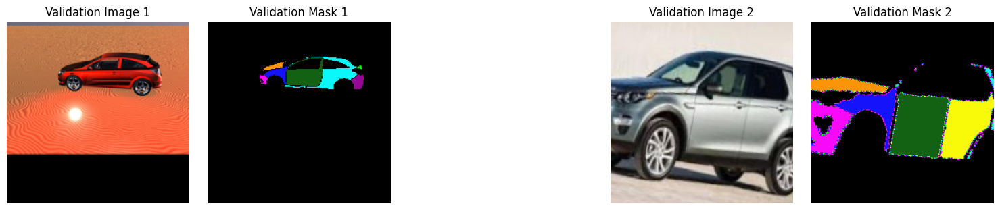

In [ ]:
# Fetch a batch of images and masks from the generators
train_images, train_masks = next(train_gen)
val_images, val_masks = next(val_gen)

def display_images(images, masks, title):
    plt.figure(figsize=(18, 6))
    for i in range(min(2, len(images))):  # Displaying first 2 images and masks
        # Normalize image data if necessary
        image = images[i] / 255.0 if images[i].max() > 1.0 else images[i]

        # Display original image
        plt.subplot(2, 6, i * 3 + 1)
        plt.imshow(image, cmap='gray' if image.shape[2] == 1 else None)
        plt.title(f"{title} Image {i+1}")
        plt.axis('off')

        # Reverse mask preprocessing
        mask = np.argmax(masks[i], axis=-1)  
        mask += 1
        mask = (mask * 10) 

        # Create an empty RGB image
        colored_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)

        # Map each class label in the mask to its corresponding color
        for class_value, color in class_to_color.items():
            colored_mask[mask == class_value] = color

        # Display mask
        plt.subplot(2, 6, i * 3 + 2)
        plt.imshow(colored_mask)
        plt.title(f"{title} Mask {i+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display images and masks from training and validation sets
display_images(train_images, train_masks, "Training")
display_images(val_images, val_masks, "Validation")

In [ ]:
callbacks = [early_stopping, model_checkpoint]
history = model.fit(train_gen,
                    steps_per_epoch=len(train_files)//16,
                    epochs=50,
                    validation_data=val_gen,
                    validation_steps=len(val_files)//16,
                    callbacks=callbacks)

Epoch 1/50
575/575 [==============================] - ETA: 0s - loss: 0.4375 - accuracy: 0.8751 - mean_io_u: 0.6416 - dice_coefficient: 0.8305
Epoch 1: val_loss improved from inf to 0.28573, saving model to pretrained_best_model.h5


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


575/575 [==============================] - 242s 368ms/step - loss: 0.4375 - accuracy: 0.8751 - mean_io_u: 0.6416 - dice_coefficient: 0.8305 - val_loss: 0.2857 - val_accuracy: 0.9097 - val_mean_io_u: 0.7010 - val_dice_coefficient: 0.8762
Epoch 2/50
575/575 [==============================] - ETA: 0s - loss: 0.2403 - accuracy: 0.9246 - mean_io_u: 0.7164 - dice_coefficient: 0.8935
Epoch 2: val_loss improved from 0.28573 to 0.21810, saving model to pretrained_best_model.h5
575/575 [==============================] - 65s 114ms/step - loss: 0.2403 - accuracy: 0.9246 - mean_io_u: 0.7164 - dice_coefficient: 0.8935 - val_loss: 0.2181 - val_accuracy: 0.9322 - val_mean_io_u: 0.7286 - val_dice_coefficient: 0.9009
Epoch 3/50
575/575 [==============================] - ETA: 0s - loss: 0.1991 - accuracy: 0.9400 - mean_io_u: 0.7366 - dice_coefficient: 0.9122
Epoch 3: val_loss improved from 0.21810 to 0.18843, saving model to pretrained_best_model.h5
575/575 [==============================] - 66s 115ms/st

In [ ]:
# Save the final model
model.save('final_pretrained_ft_model.h5')

## **EVALUATE**

In [ ]:
!pip install visualkeras

  Obtaining dependency information for aggdraw>=1.3.11 from https://files.pythonhosted.org/packages/da/05/8912c901a3965ec7117d6cc33eaec3888c717611f72ce69d8be62a01d149/aggdraw-1.3.18-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 4.6 MB/s eta 0:00:0000:0100:01


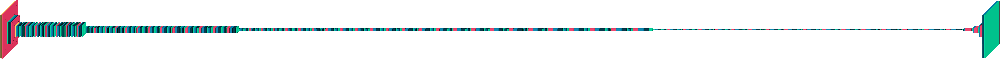

In [ ]:
import visualkeras
visualkeras.layered_view(model)

### **Test datasets**

In [ ]:
test_directory = "/kaggle/input/test-data/test"
test_files = os.listdir(test_directory)
test_gen = data_generator(test_files, test_directory, batch_size=16, num_classes=9)

In [ ]:
# Evaluate the model on the training data
train_metrics = model.evaluate(train_gen, steps=len(train_files)//16)
print("Training Data Evaluation:")
print(f"Loss: {train_metrics[0]}, Accuracy: {train_metrics[1]}, Mean IoU: {train_metrics[2]}, Dice Coefficient: {train_metrics[3]}")

# Evaluate the model on the validation data
val_metrics = model.evaluate(val_gen, steps=len(val_files)//16)
print("Validation Data Evaluation:")
print(f"Loss: {val_metrics[0]}, Accuracy: {val_metrics[1]}, Mean IoU: {val_metrics[2]}, Dice Coefficient: {val_metrics[3]}")

# Evaluate the model on the test data
test_metrics = model.evaluate(test_gen, steps=len(test_files)//16)
print("Test Data Evaluation:")
print(f"Loss: {test_metrics[0]}, Accuracy: {test_metrics[1]}, Mean IoU: {test_metrics[2]}, Dice Coefficient: {test_metrics[3]}")

575/575 [==============================] - 46s 79ms/step - loss: 0.0947 - accuracy: 0.9695 - mean_io_u: 0.7962 - dice_coefficient: 0.9566
Training Data Evaluation:
Loss: 0.09473709017038345, Accuracy: 0.9695049524307251, Mean IoU: 0.7962460517883301, Dice Coefficient: 0.956599235534668
143/143 [==============================] - 12s 84ms/step - loss: 0.1102 - accuracy: 0.9651 - mean_io_u: 0.7900 - dice_coefficient: 0.9513
Validation Data Evaluation:
Loss: 0.11016035079956055, Accuracy: 0.9651371240615845, Mean IoU: 0.7900187969207764, Dice Coefficient: 0.9513232707977295
1/1 [==============================] - 7s 7s/step - loss: 0.1500 - accuracy: 0.9532 - mean_io_u: 0.6890 - dice_coefficient: 0.9321
Test Data Evaluation:
Loss: 0.14996518194675446, Accuracy: 0.9532246589660645, Mean IoU: 0.6889732480049133, Dice Coefficient: 0.932077169418335


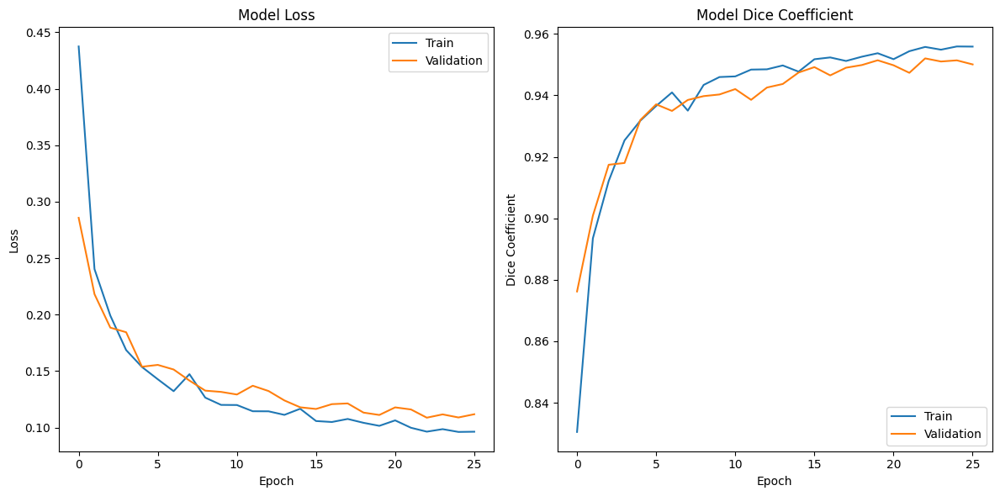

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Plot training & validation dice coefficient values
plt.subplot(1, 2, 2)
plt.plot(history.history['dice_coefficient'])
plt.plot(history.history['val_dice_coefficient'])
plt.title('Model Dice Coefficient')
plt.xlabel('Epoch')
plt.ylabel('Dice Coefficient')
plt.legend(['Train', 'Validation'], loc='lower right')

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def display_predictions_from_generator(model, data_gen, class_to_color, num_examples=5):
    for i in range(num_examples):
        # Fetch a batch of images and their true masks from the data generator
        images, true_masks = next(data_gen)
        image = images[0]  
        true_mask = true_masks[0]  

        # Predict the mask for the image
        pred_mask_probabilities = model.predict(np.expand_dims(image, axis=0))[0]
        pred_mask = np.argmax(pred_mask_probabilities, axis=-1) * 10 + 10

        # Reverse mask preprocessing for true mask
        true_mask = np.argmax(true_mask, axis=-1) * 10 + 10
        true_colored_mask = np.zeros((*true_mask.shape, 3), dtype=np.uint8)
        pred_colored_mask = np.zeros_like(true_colored_mask)
        for class_value, color in class_to_color.items():
            true_colored_mask[true_mask == class_value] = color
            pred_colored_mask[pred_mask == class_value] = color

        # Normalize image for display if it's not in the 0-1 range
        if image.max() > 1.0:
            image = image / 255.0

        # Display the images
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(true_colored_mask)
        plt.title("True Mask")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(pred_colored_mask)
        plt.title("Predicted Mask")
        plt.axis('off')

        plt.show()

1/1 [==============================] - 5s 5s/step


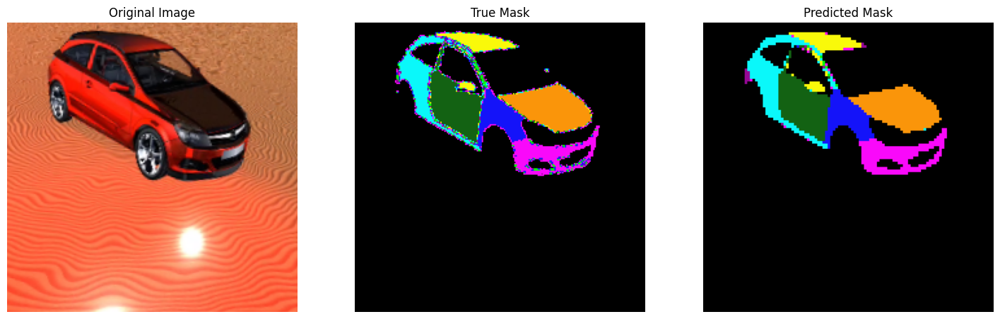

1/1 [==============================] - 0s 143ms/step


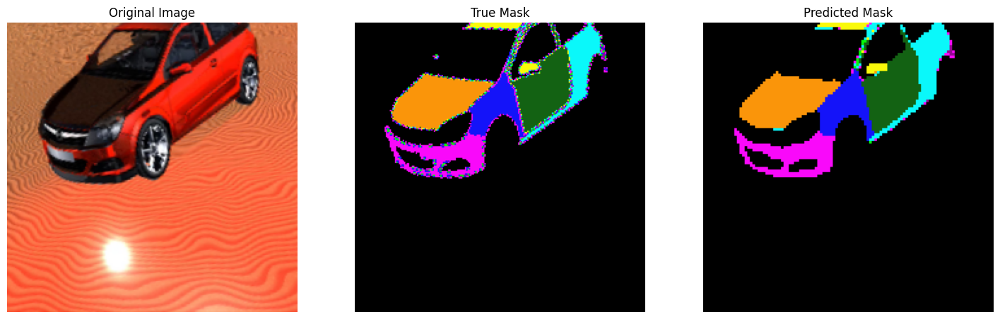

1/1 [==============================] - 0s 148ms/step


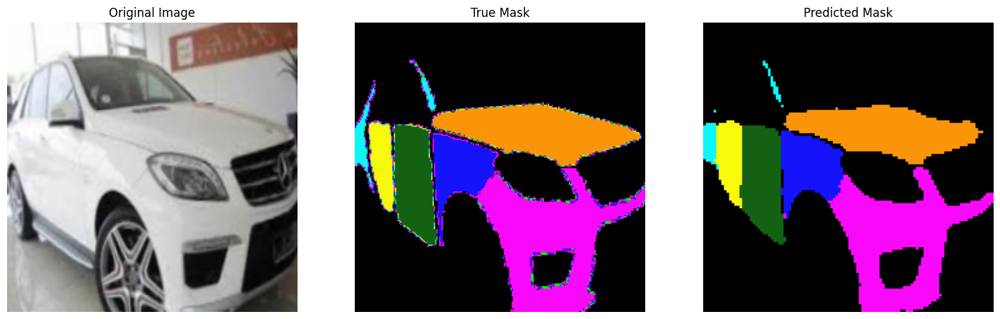

1/1 [==============================] - 0s 140ms/step


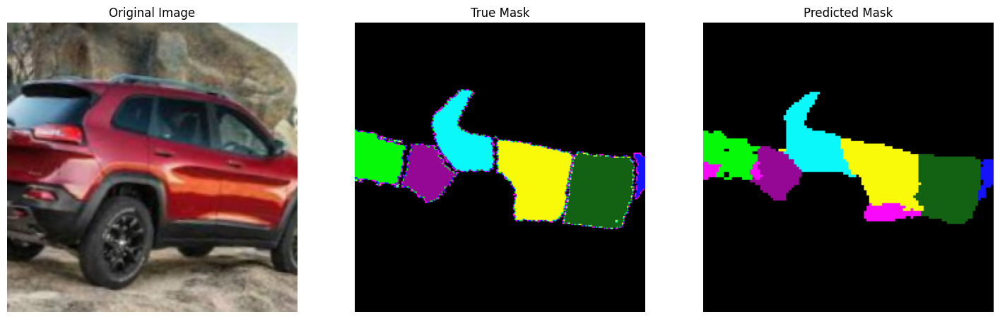

1/1 [==============================] - 0s 144ms/step


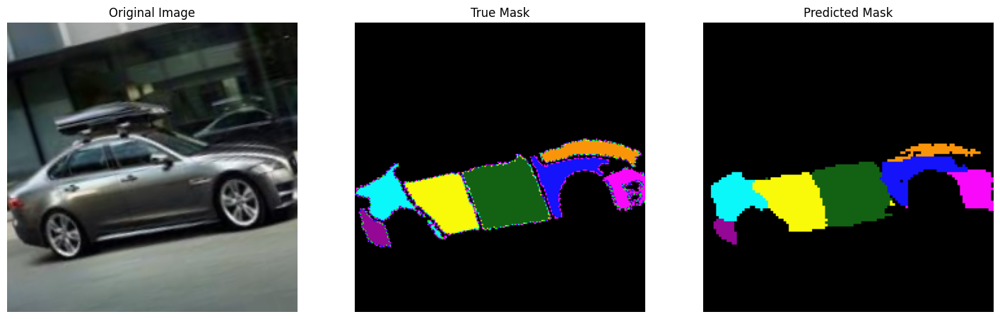

In [ ]:
display_predictions_from_generator(model, train_gen, class_to_color, num_examples=5)

1/1 [==============================] - 0s 139ms/step


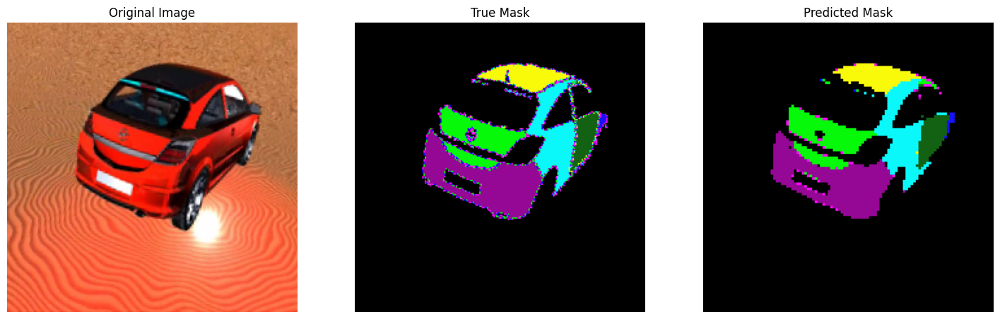

1/1 [==============================] - 0s 140ms/step


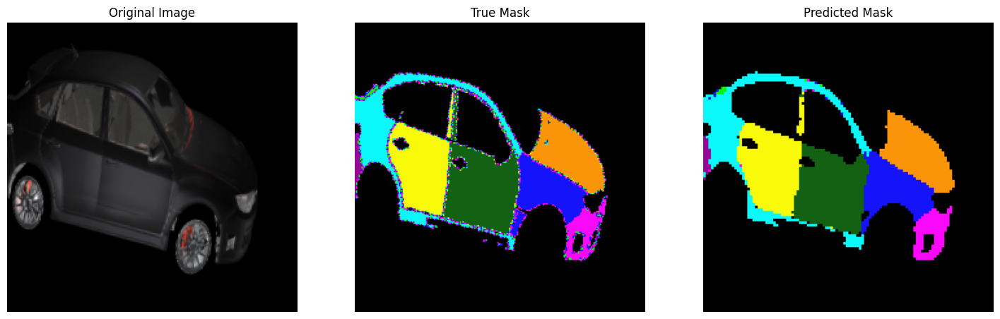

1/1 [==============================] - 0s 134ms/step


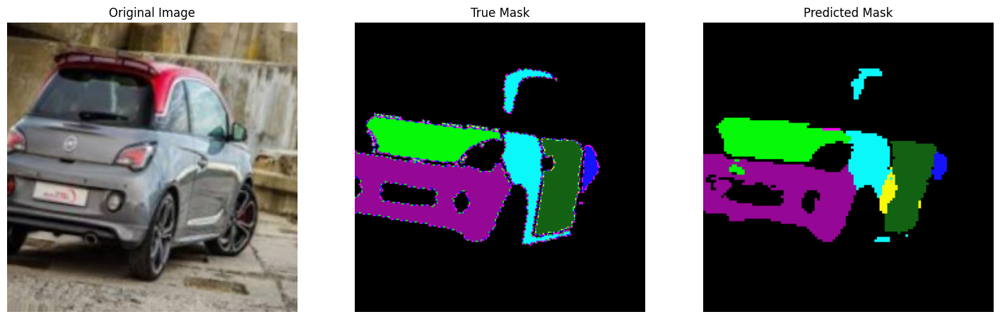

1/1 [==============================] - 0s 134ms/step


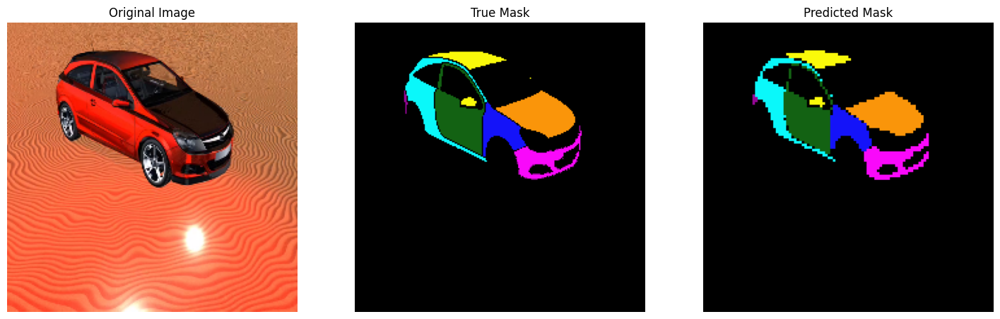

1/1 [==============================] - 0s 155ms/step


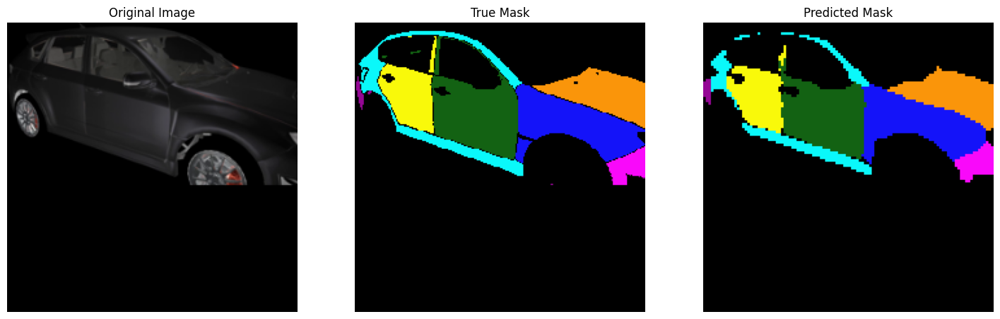

In [ ]:
display_predictions_from_generator(model, train_gen, class_to_color, num_examples=5)

1/1 [==============================] - 5s 5s/step


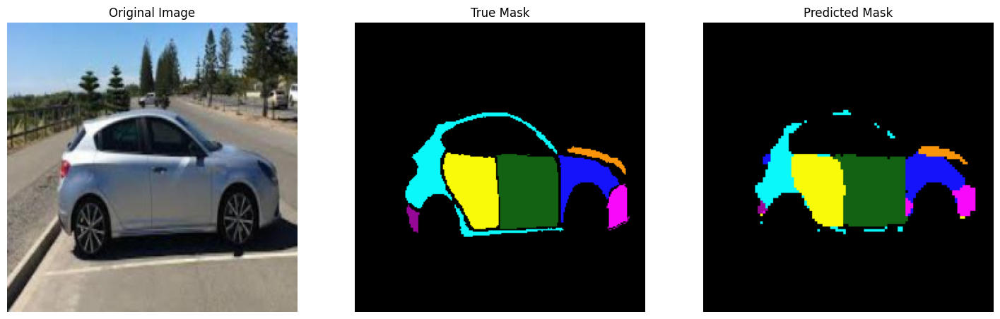

1/1 [==============================] - 0s 146ms/step


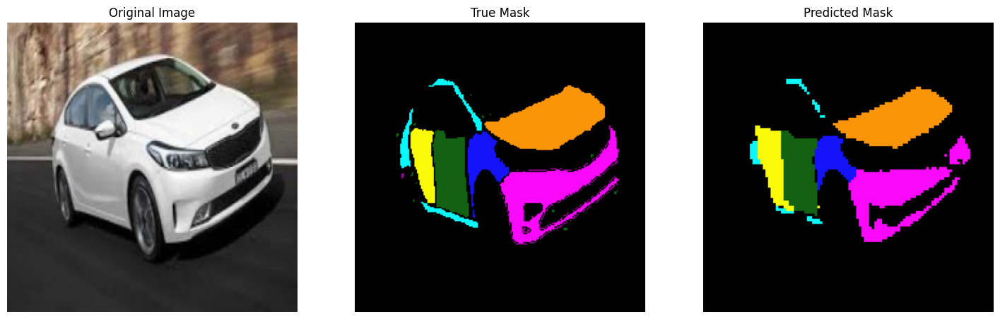

1/1 [==============================] - 0s 143ms/step


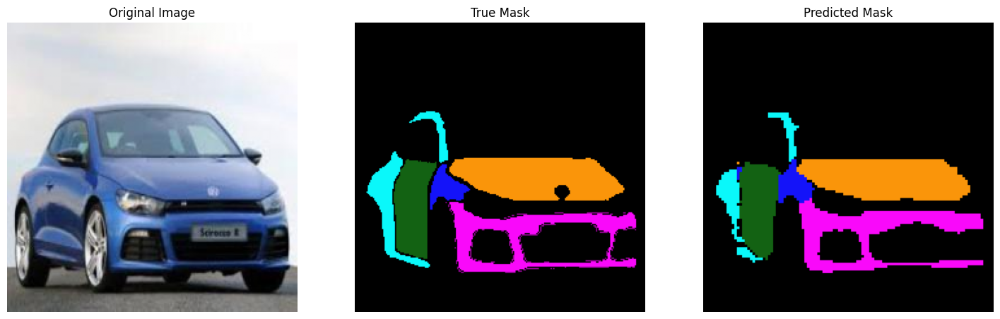

1/1 [==============================] - 0s 140ms/step


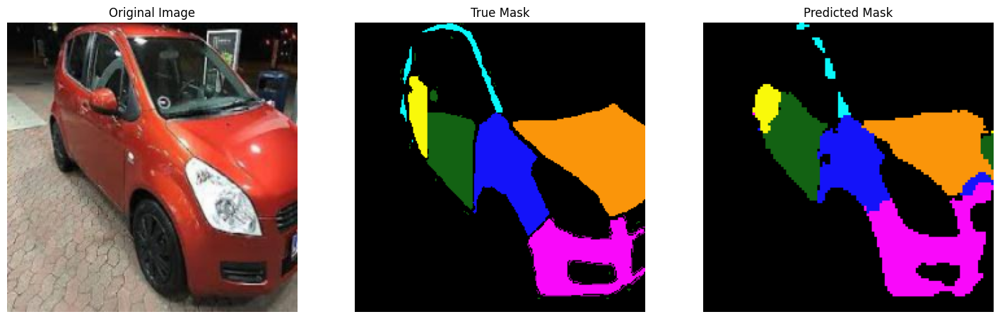

1/1 [==============================] - 0s 141ms/step


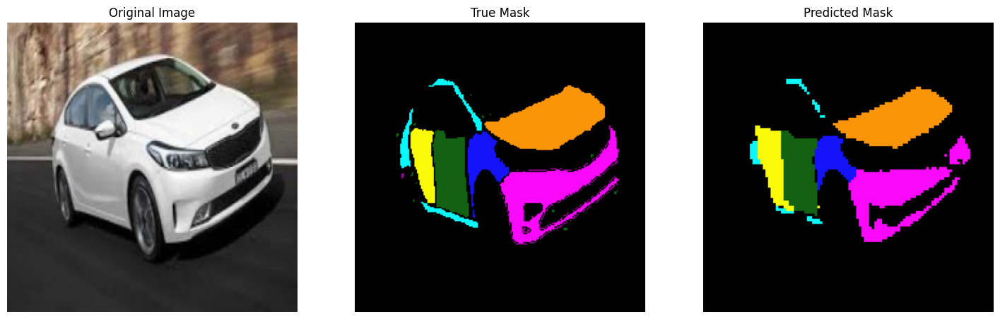

1/1 [==============================] - 0s 147ms/step


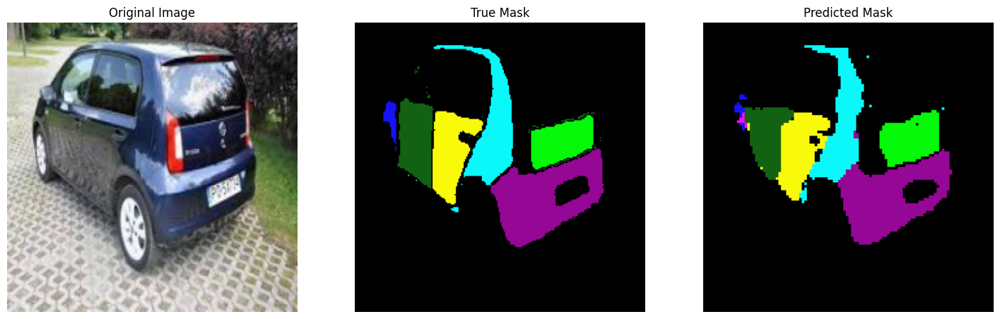

1/1 [==============================] - 0s 144ms/step


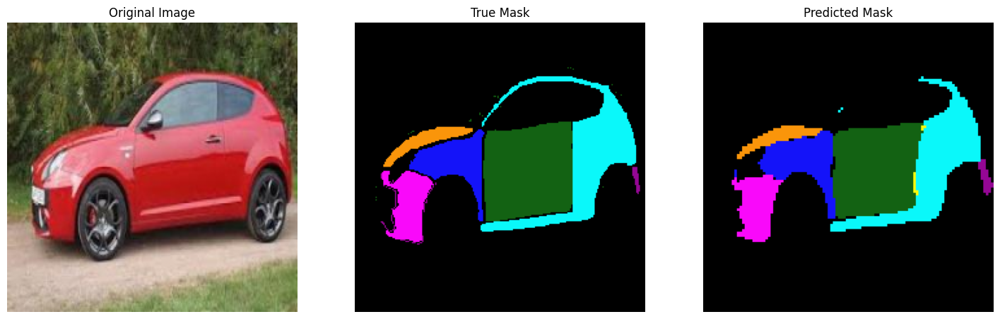

1/1 [==============================] - 0s 145ms/step


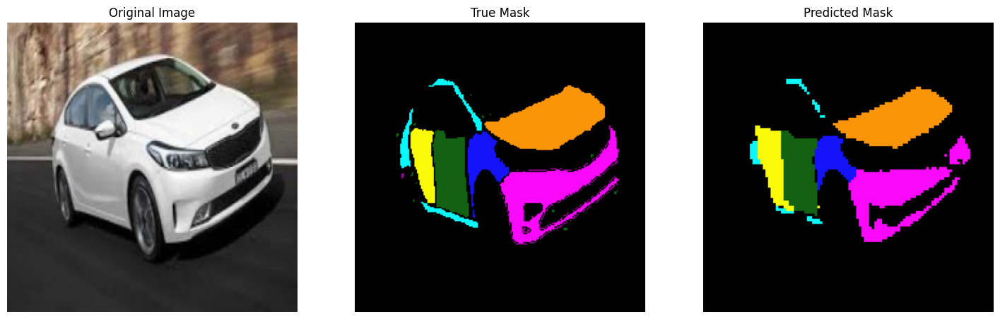

1/1 [==============================] - 0s 137ms/step


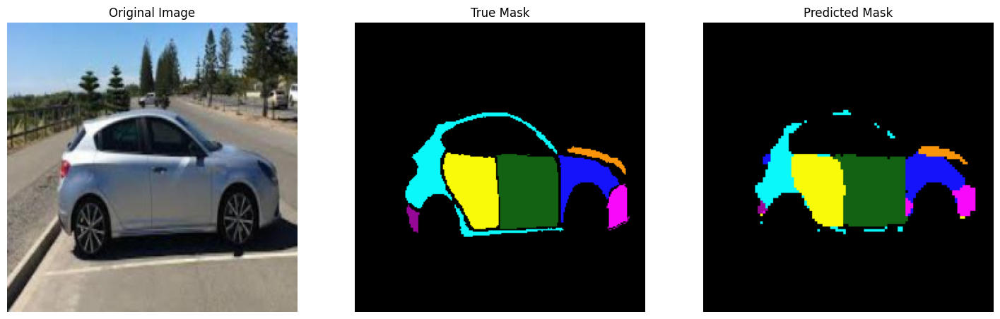

1/1 [==============================] - 0s 136ms/step


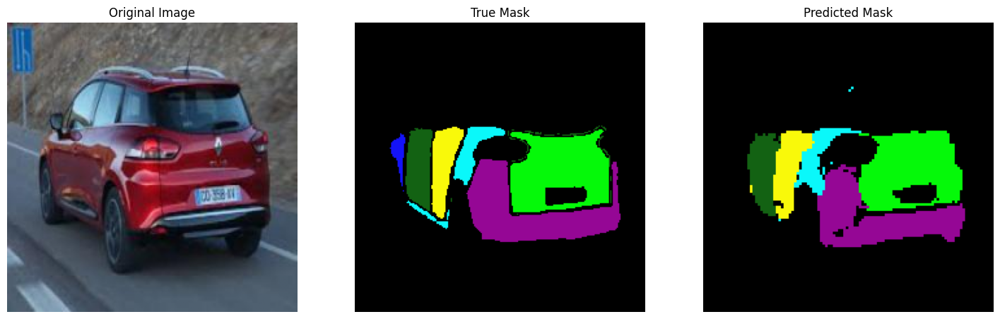

1/1 [==============================] - 0s 134ms/step


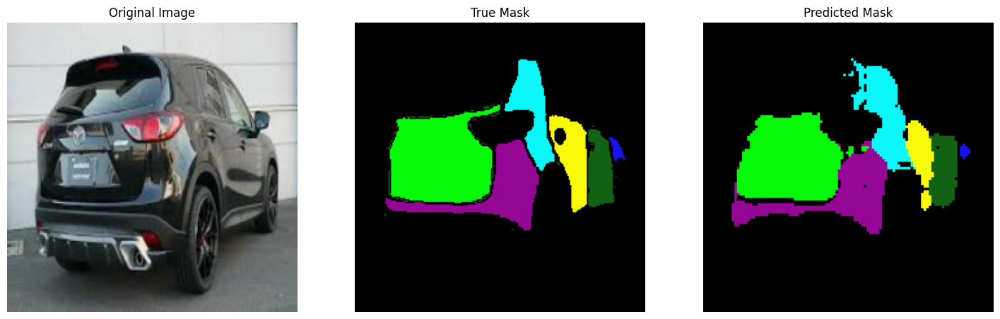

1/1 [==============================] - 0s 136ms/step


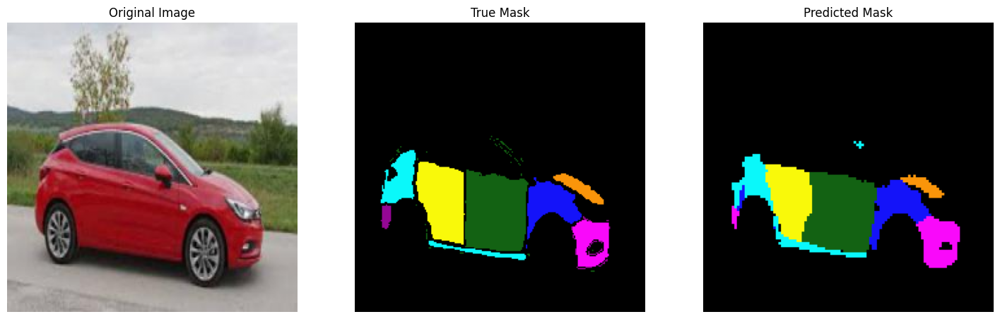

1/1 [==============================] - 0s 136ms/step


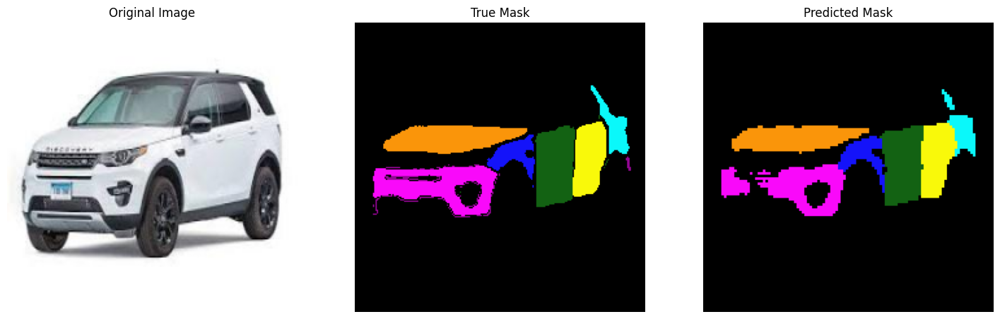

1/1 [==============================] - 0s 140ms/step


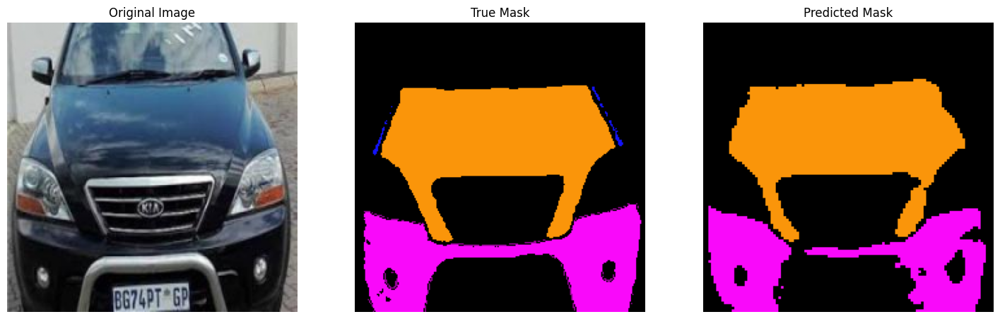

1/1 [==============================] - 0s 142ms/step


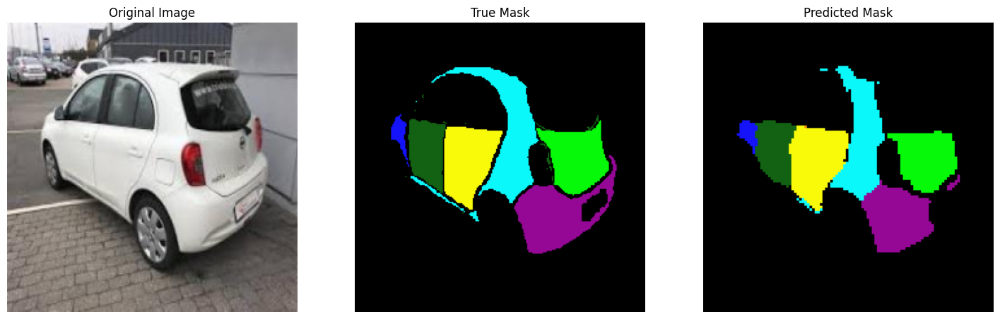

1/1 [==============================] - 0s 141ms/step


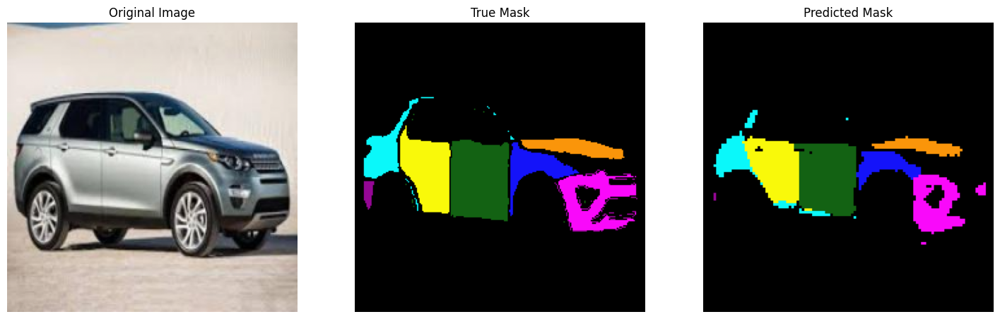

1/1 [==============================] - 0s 141ms/step


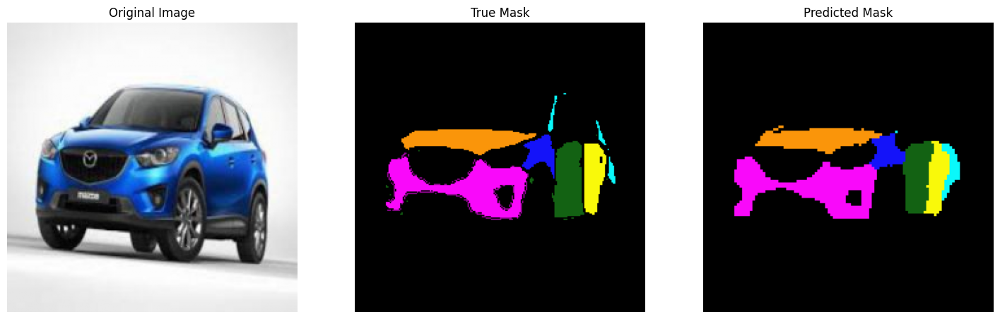

1/1 [==============================] - 0s 138ms/step


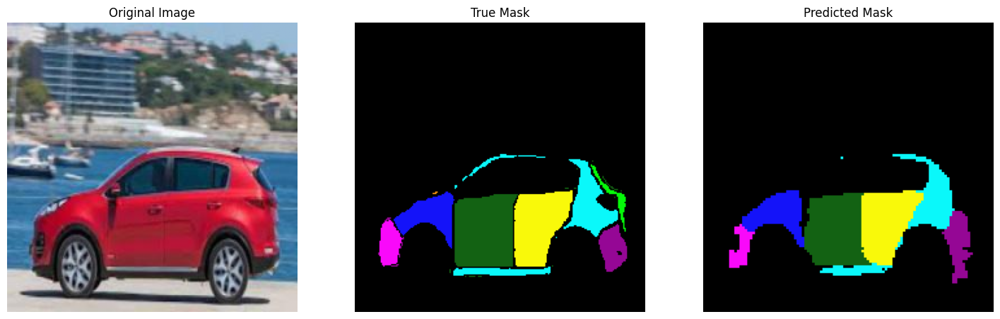

1/1 [==============================] - 0s 156ms/step


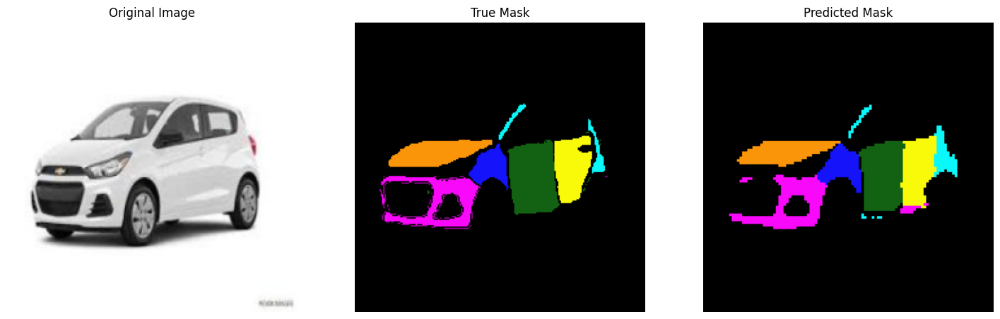

1/1 [==============================] - 0s 141ms/step


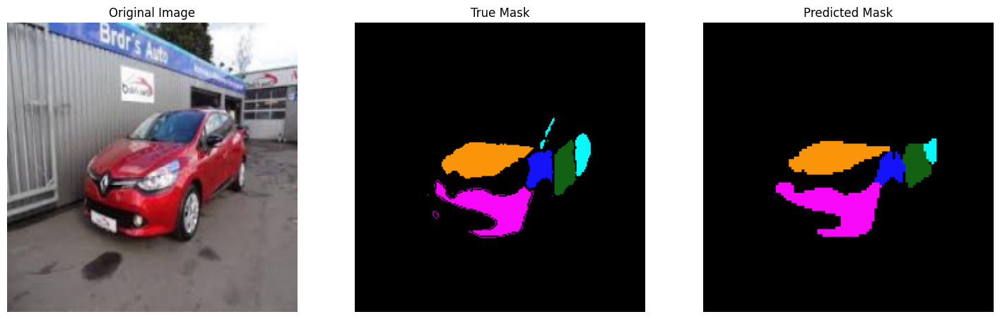

1/1 [==============================] - 0s 136ms/step


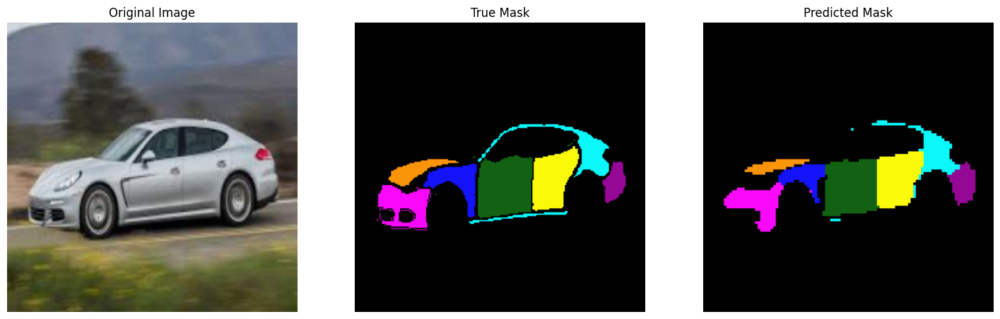

1/1 [==============================] - 0s 141ms/step


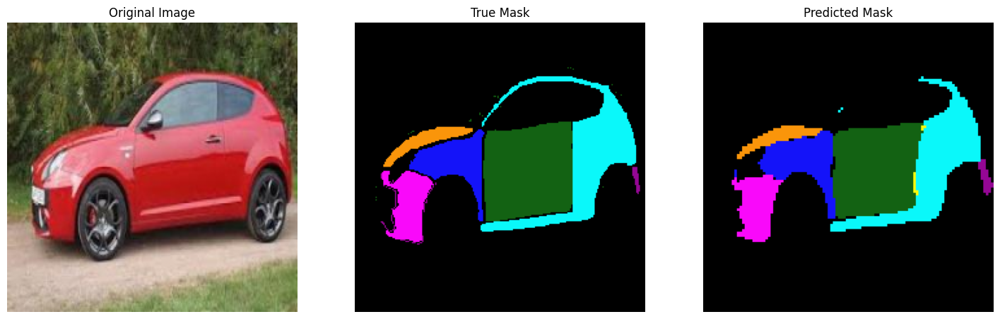

1/1 [==============================] - 0s 141ms/step


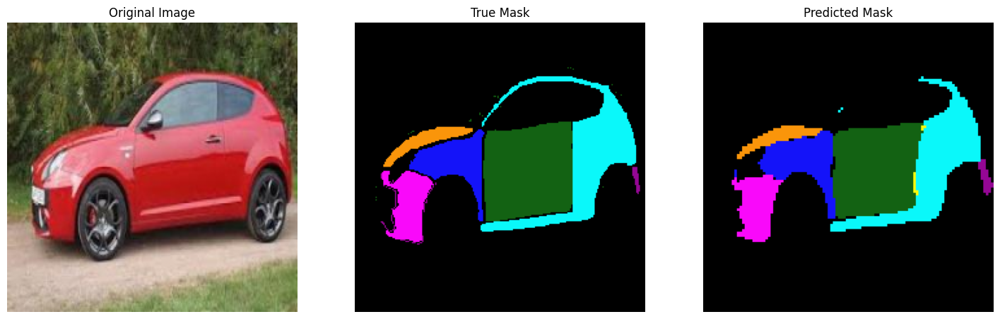

1/1 [==============================] - 0s 140ms/step


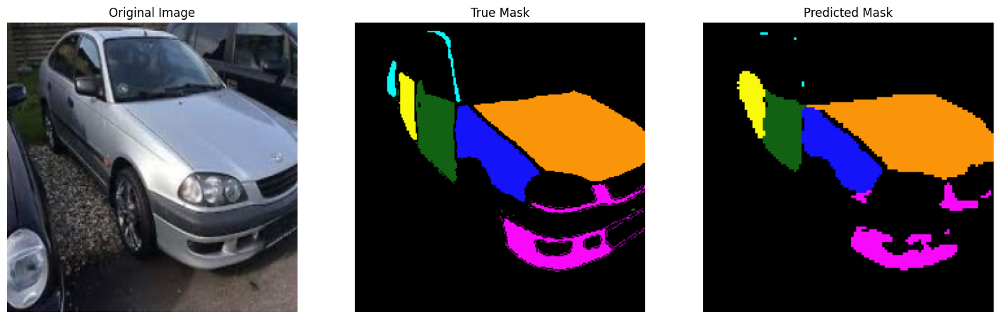

1/1 [==============================] - 0s 142ms/step


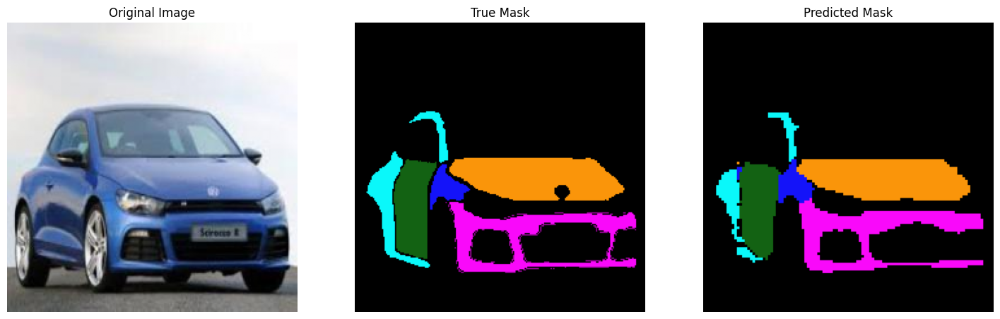

1/1 [==============================] - 0s 141ms/step


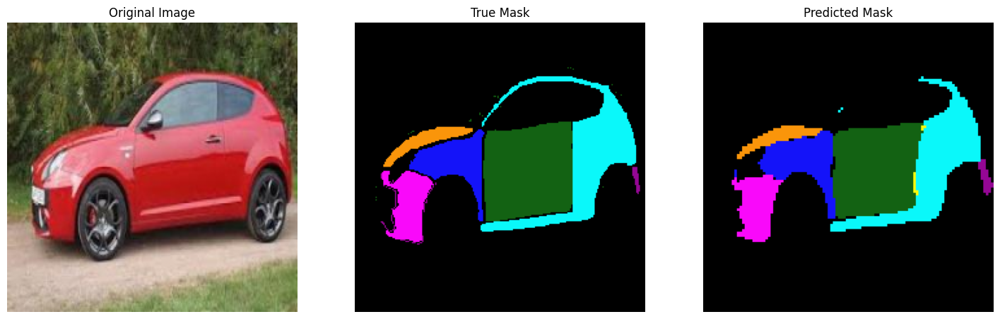

1/1 [==============================] - 0s 145ms/step


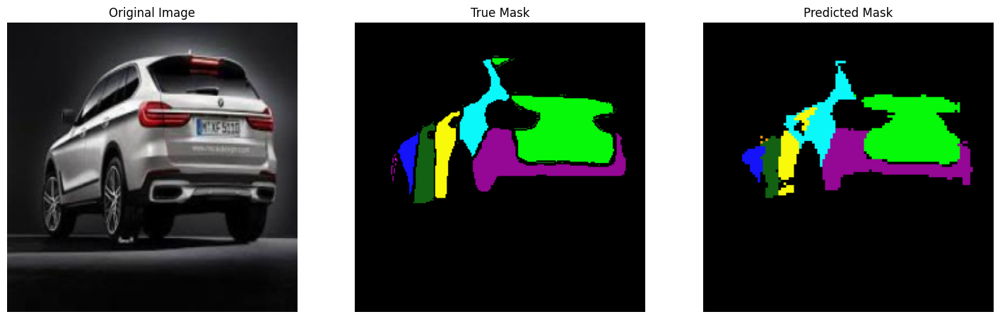

1/1 [==============================] - 0s 134ms/step


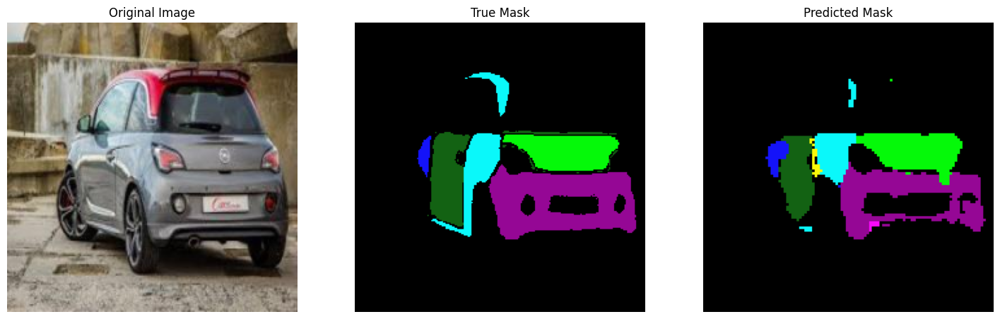

1/1 [==============================] - 0s 133ms/step


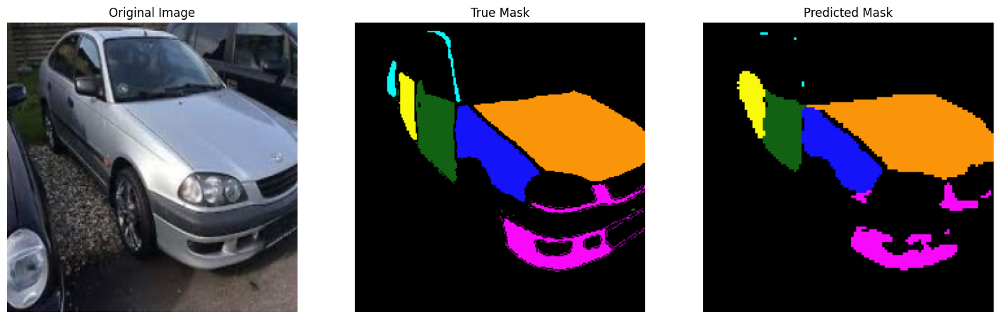

1/1 [==============================] - 0s 140ms/step


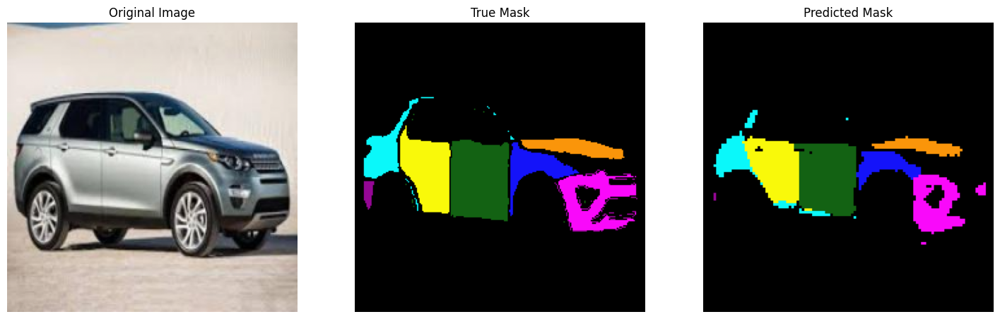

In [ ]:
display_predictions_from_generator(model, test_gen, class_to_color, num_examples=30)